# Ames Data Analysis

In [1]:
from category_encoders import LeaveOneOutEncoder
import math
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import f_oneway, pearsonr
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import OLSInfluence
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

from pipeline_v1 import ordinal, nominal, continuous, discrete

# Data

In [2]:
# Get Data
X_filename = "../data/processed/X_train.csv"
y_filename = "../data/processed/y_train.csv"
df = pd.read_csv(X_filename)
y = pd.read_csv(y_filename)
df["Sale_Price"] = y

# Metadata
metafile = "../data/metadata/feature_metadata.csv"
def read_meta():
    return pd.read_csv(metafile)
def write_meta(meta):
    meta.to_csv(metafile, index=False)
meta = read_meta()
xref = dict(meta[["Category", "Feature"]].values)
print(xref)
 
binary = meta[meta["Type"] == "Binary"]["Feature"].values.tolist()
numeric = meta[meta["Type"] != "Binary"]["Feature"].values.tolist()

{'Lot': 'Premium_Config', 'Size': 'Bsmt_Liv_Area', 'Exterior': 'Stone_Vnr', 'Basement': 'Bsmt_Quality', 'Garage': 'Garage_Age', 'Amenities': 'Poor_Heating', 'Misc': 'Misc_Feature', 'Age': 'Age_Remod', 'Kitchen': 'Kitchen_Excellent', 'Sale': 'Qtr_Sold', 'Type': 'Two_Story', 'Location': 'Street_Adjacent_2', 'Access': 'Paved_Drive', 'Neighborhood': 'Neighborhood_Quality', 'Condition': 'Overall_Qual', 'Roof': 'Roof_Matl', 'Foundation': 'Poured_Concrete', 'Utilities': 'Utilities', 'Price': 'Sale_Price_per_1KSF', 'Economics': 'HPI'}


# Interaction Analysis

In [3]:
def get_formula(features, interactions=True):
    formulas = []
    formula = "Sale_Price ~"
    variable = ""
    i_vars = []
    for feature in features:
        i_var = "C(" + feature + ", Sum)"
        i_vars.append(i_var)
        variable += "C(" + feature + ", Sum) + "        
    s1 = "*"    
    interactions = s1.join(i_vars)
    formula = formula + variable + interactions    
    return formula

In [4]:
def anova(features):
    anova_filename = "../analysis/anova.csv"
    influence_filename = "../analysis/influence.csv"
    formula = get_formula(features)
    print(formula)
    model = ols(formula,data=df).fit()
    aov_table = sm.stats.anova_lm(model, typ=3)
    aov_table.to_csv(anova_filename, index=False)
    influence = model.get_influence().summary_frame()
    influence.to_csv(influence_filename, index=False)
    return aov_table, influence
#aov_table, influence = anova(numeric[0:2])
#print(aov_table)
#print(influence[0:5])


In [5]:
# Linear Regression with interaction terms
poly = PolynomialFeatures(degree=3, interaction_only=True)
model = LinearRegression(n_jobs=4)
def i_regression(df, features):
    features = list(set.intersection(set(features), set(df.columns.tolist())))
    
    X = df[features]
    X = poly.fit_transform(X)
    poly_features = poly.get_feature_names(features)
    print("="*40)
    print("    Interaction of Continuous Terms")
    print(f"            Input Terms: {poly.n_input_features_}")
    print(f"           Output Terms: {poly.n_output_features_}")
    print("-"*40)
    y = df["Sale_Price"].values.reshape(-1,1)
    X = pd.DataFrame(data=X, columns=poly_features)
    model = sm.OLS(y, X)
    results = model.fit()
    results_summary = results.summary()
    results_as_html = results_summary.tables[1].as_html()
    df_summary = pd.read_html(results_as_html, header=0, index_col=0)[0]
    filename = "../analysis/interaction_" + str(poly.n_input_features_) +\
        "_input_features_" +str(poly.n_output_features_) + \
            "_output_features.csv"    
    df_summary.to_csv(filename, index=False)    
    print(df_summary)
    print("="*40)
    return df_summary

for i in range(2,len(numeric)):
    i_regression(df, numeric[0:i])




    Interaction of Continuous Terms
            Input Terms: 2
           Output Terms: 4
----------------------------------------
                          coef  std err         t  P>|t|  [0.025  0.975]
1                      12.0195    0.008  1598.374  0.000  12.005  12.034
Lot_Area               -0.0030    0.008    -0.394  0.693  -0.018   0.012
Lot_Frontage           -0.0140    0.008    -1.813  0.070  -0.029   0.001
Lot_Area Lot_Frontage   0.0030    0.004     0.762  0.446  -0.005   0.011
    Interaction of Continuous Terms
            Input Terms: 3
           Output Terms: 8
----------------------------------------
                                       coef  std err         t  P>|t|  [0.025  \
1                                   12.0194    0.008  1584.321  0.000  12.005   
Mas_Vnr_Area                         0.0094    0.008     1.169  0.243  -0.006   
Lot_Area                            -0.0063    0.009    -0.741  0.459  -0.023   
Lot_Frontage                        -0.0137    0.

In [6]:
def visualize_summary(df):
    fig, ax = plt.subplots(figsize=(12,6))
    sns.barplot(x="R2", y="Category", data=df, ax=ax)
    plt.title(f"Performance of Feature Categories", fontsize=20)        
    plt.show()
def visualize_numeric(df, category="All", figsize=None):
    figsize = figsize or (12,6)
    fig, ax = plt.subplots(figsize=figsize)
    sns.barplot(x="R2", y="Feature", data=df, ax=ax)
    plt.title(f"Performance of Feature Categories\nCategory: {category}", fontsize=20)        
    plt.show()    
def visualize_r2(df, figsize=None):
    df.sort_values(by="R2", inplace=True, ascending=False)
    figsize = figsize or (8,24)
    fig, ax = plt.subplots(figsize=figsize)
    sns.barplot(x="R2", y="Feature", data=df, ax=ax)
    plt.title(f"Feature Relevance")
    plt.tight_layout()
    plt.show()    

def visualize_binary(df):    
    nrows = math.ceil(len(binary)/2)
    ncols = 2
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8,24), sharex=False, sharey=False)
    for idx, ax in enumerate(axes.flatten()):
        sns.boxplot(y="Sale_Price", x=binary[idx], data=df, ax=ax)
        ax.set_title(binary[idx])
    fig.suptitle("Binary Analysis", fontsize=20)  
    plt.tight_layout()      
    plt.show()    


# Binary Analysis


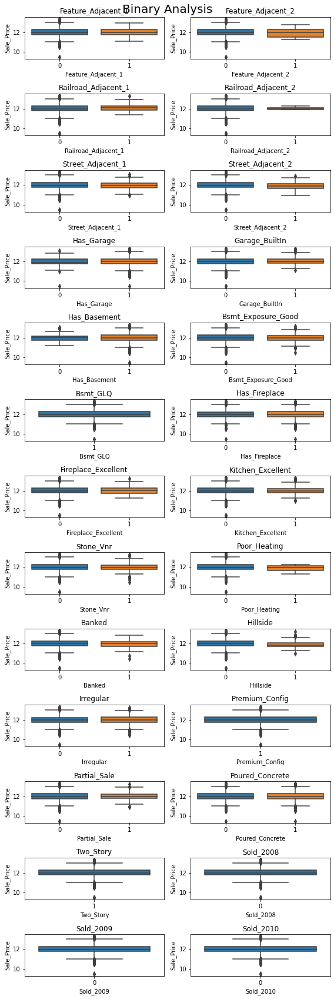

In [7]:
visualize_binary(df)

# Linear Regression

In [8]:
model = LinearRegression()
def regression(df, feature):
    X = df[feature].values.reshape(-1,1)
    y = df["Sale_Price"].values.reshape(-1,1)
    model.fit(X,y)
    return model.score(X,y)    



# Numeric Analysis

In [9]:
a = df.columns.tolist()
features = list(set(a) & set(numeric))

for feature in features:
    r2 = regression(df, feature)
    meta.loc[meta["Feature"] == feature, "R2"] = r2
write_meta(meta)

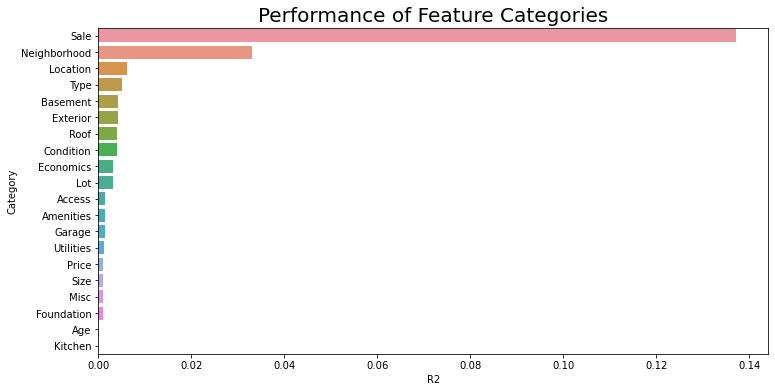

In [10]:
# Summarize Feature Categories
summary = meta.groupby("Category").max()
summary = summary.reset_index()
summary = summary.sort_values(by="R2",ascending=False)    
visualize_summary(summary)



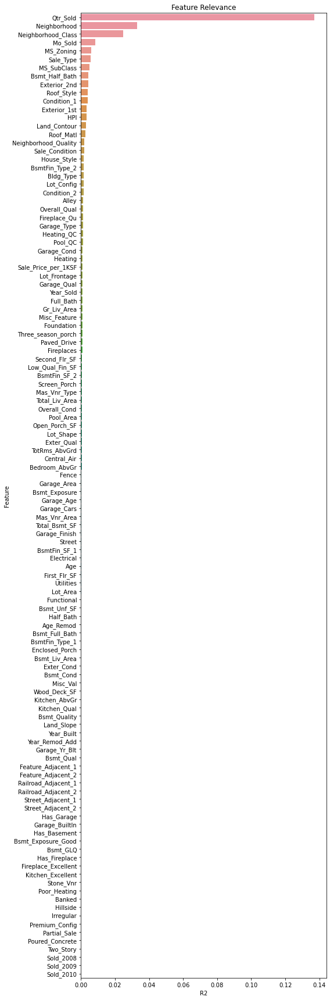

In [11]:
meta = read_meta()
visualize_r2(meta)

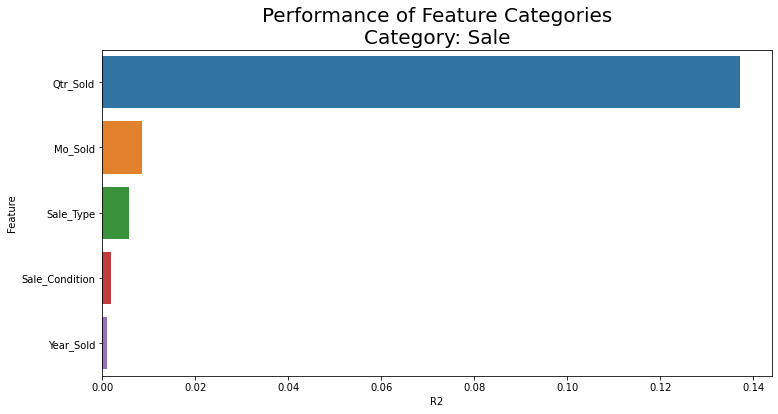

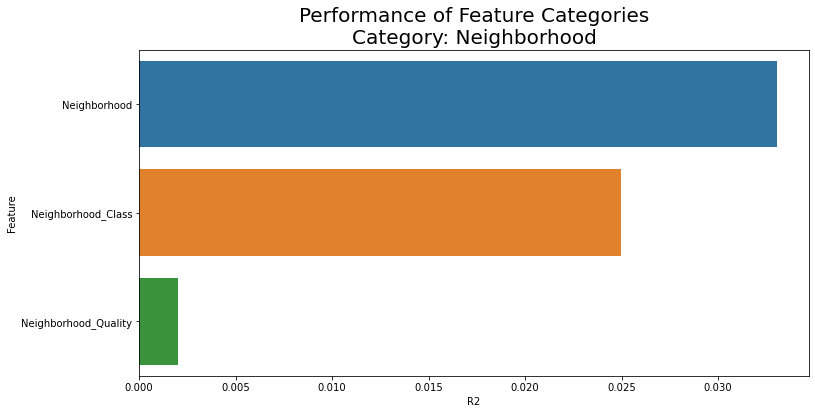

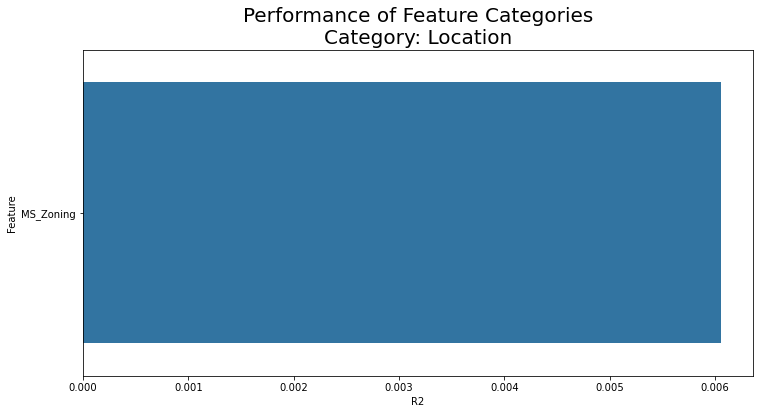

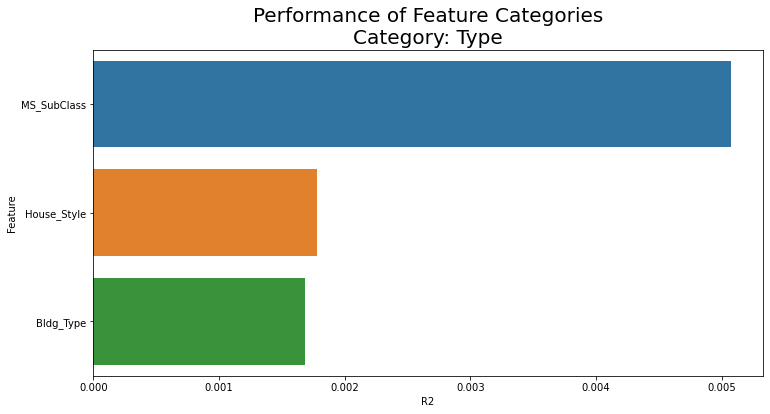

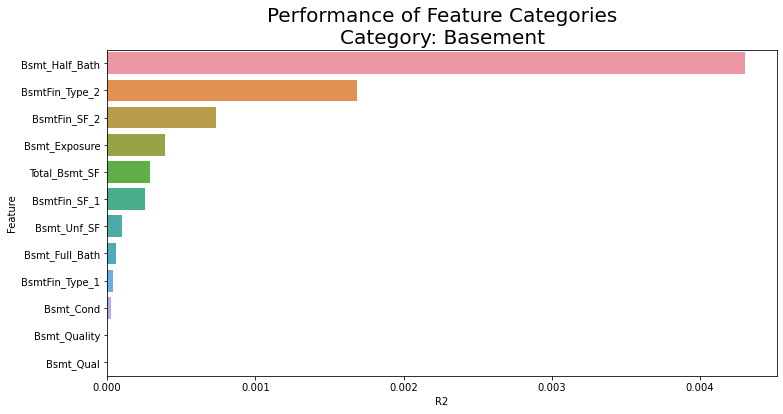

...

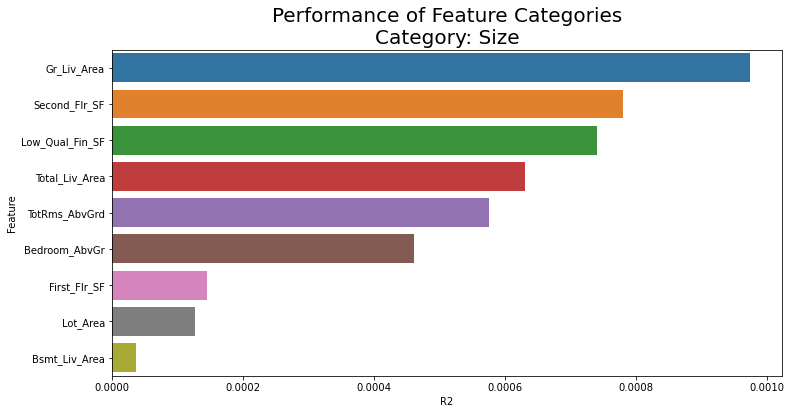

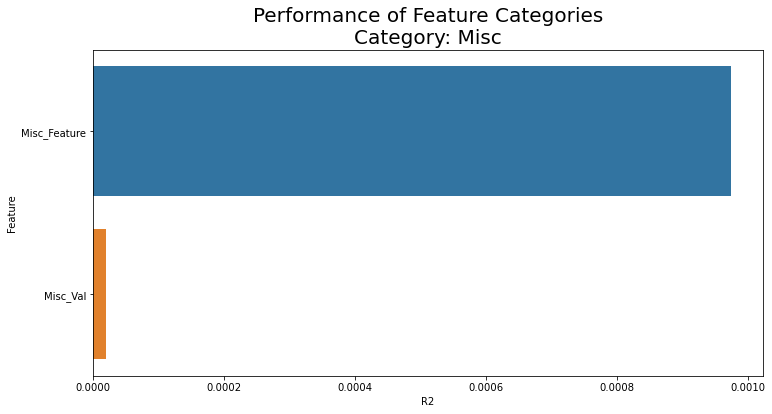

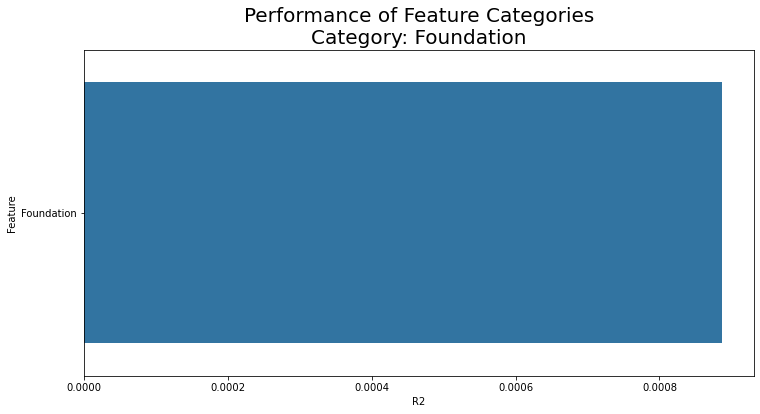

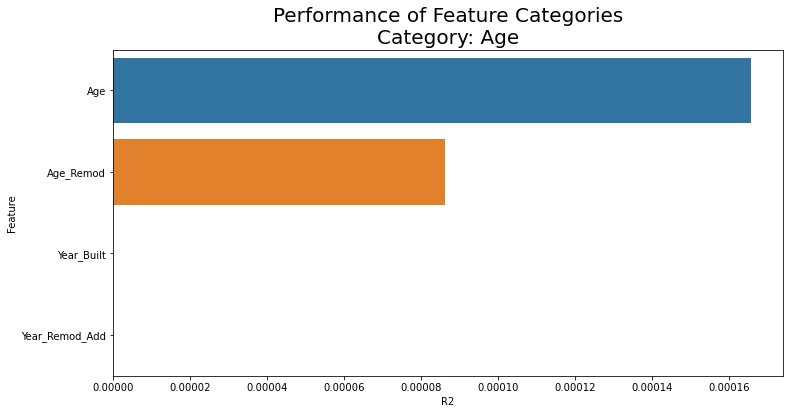

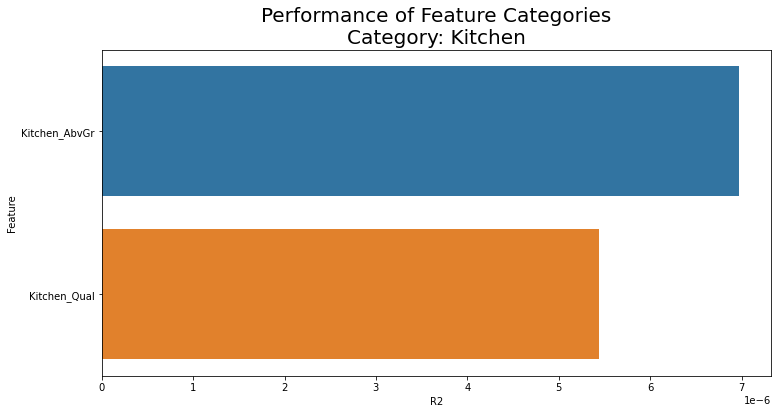

In [12]:
for category in summary.Category:
    features = meta[(meta["Category"]==category) & (meta["Type"]!= "Binary")]
    features.sort_values(by="R2", ascending=False, inplace=True)
    visualize_numeric(features, category)    
    